In [1]:
using Plots
using LinearAlgebra
using LaTeXStrings
using StatsBase
using CSV
using DataFrames

In [2]:
t_start = time();

## Parameters:

In [3]:
t0 = 1.0;
t = 1.0;
t_prime = -1.5;
m_0 = 3.0;
x_periodic = 1;
y_periodic = 1;

L = 100;
l1 = Int(round(L/4));
l2 = Int(round(L/2));
m_lattice = Int(round(L/2));

Lx = L;
Ly = L;

exportdata=1;

Equation of two lines are $y = mx + c_1$ and $y = mx + c_2$

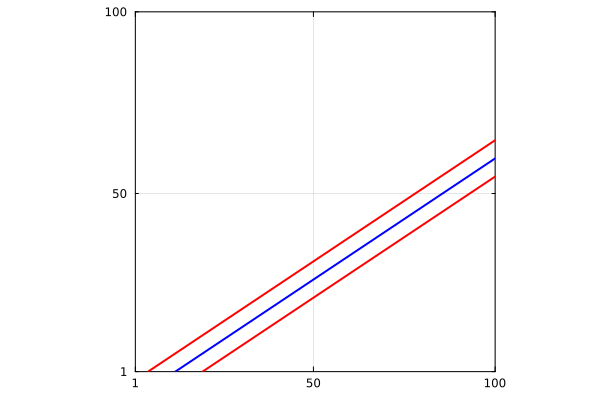

In [4]:
#m = (-1+sqrt(5))/2
m=2/3;
c1 = -12
c2 = -2

function line_down(x::Float64)
    return c1 + m*x
end

function line_up(x::Float64)
    return c2 + m*x
end

function line_middle(x::Float64)
    return (line_up(x) + line_down(x))/2
end

line_x = [1.0,L+1]
line_down_y = line_down.(line_x)
line_up_y = line_up.(line_x)

plot(line_x,line_down_y,color="red",width=2, xlims=(1,Lx),ylims=(1,Ly),legend=:none,aspect_ratio=:equal,frame=:box, framestyle=:thick,xticks=[1,Lx/2,Lx],yticks=[1,Ly/2,Ly])
plot!(line_x,line_up_y,color="red",width=2)
plot!(line_x,line_middle.(line_x),color="blue",width=2)

In [5]:
points_x_array_dummy = range(1, Lx+1,Lx+1)
points_y_array_dummy = range(1, Ly,Ly)

n_atoms = Lx*Ly + l2;
points2 = zeros(2*n_atoms);

for ii = 1:m_lattice
    for jj = 1:l1
        points2[2*((jj-1)*Lx+ii)-1] = points_x_array_dummy[ii]
        points2[2*((jj-1)*Lx+ii)] = points_y_array_dummy[jj]
    end
end

for ii = m_lattice+2:Lx+1
    for jj = 1:l1
        points2[2*((jj-1)*Lx+ii-1)-1] = points_x_array_dummy[ii]
        points2[2*((jj-1)*Lx+ii-1)] = points_y_array_dummy[jj]
    end
end

for ii = 1:Lx+1
    for jj = 1:l2
        points2[2*(Lx*l1+(jj-1)*(Lx+1)+ii)-1] = points_x_array_dummy[ii]
        points2[2*(Lx*l1+(jj-1)*(Lx+1)+ii)] = points_y_array_dummy[jj+l1]
    end
end

for ii = 1:m_lattice
    for jj = 1:Ly-l1-l2
        points2[2*((Lx*(l1+l2)+l2)+(jj-1)*Lx+ii)-1] = points_x_array_dummy[ii]
        points2[2*((Lx*(l1+l2)+l2)+(jj-1)*Lx+ii)] = points_y_array_dummy[jj+l1+l2]
    end
end

for ii = m_lattice+2:Lx+1
    for jj = 1:Ly-l1-l2
        points2[2*((Lx*(l1+l2)+l2)+(jj-1)*Lx+ii-1)-1] = points_x_array_dummy[ii]
        points2[2*((Lx*(l1+l2)+l2)+(jj-1)*Lx+ii-1)] = points_y_array_dummy[jj+l1+l2]
    end
end


### These arrays have N^2 elements, and hold the x and y coordinates of nth site
points_x_array = points2[1:2:end];
points_y_array =  points2[2:2:end];


In [6]:
println(points_x_array)

[1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 59.0, 60.0, 61.0, 62.0, 63.0, 64.0, 65.0, 66.0, 67.0, 68.0, 69.0, 70.0, 71.0, 72.0, 73.0, 74.0, 75.0, 76.0, 77.0, 78.0, 79.0, 80.0, 81.0, 82.0, 83.0, 84.0, 85.0, 86.0, 87.0, 88.0, 89.0, 90.0, 91.0, 92.0, 93.0, 94.0, 95.0, 96.0, 97.0, 98.0, 99.0, 100.0, 101.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 59.0, 60.0, 61.0, 62.0, 63.0, 64.0, 65.0, 66.0, 67.0, 68.0, 69.0, 70.0, 7

In [7]:
println(points_y_array)

[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0,

### Now we isolate the PTB points

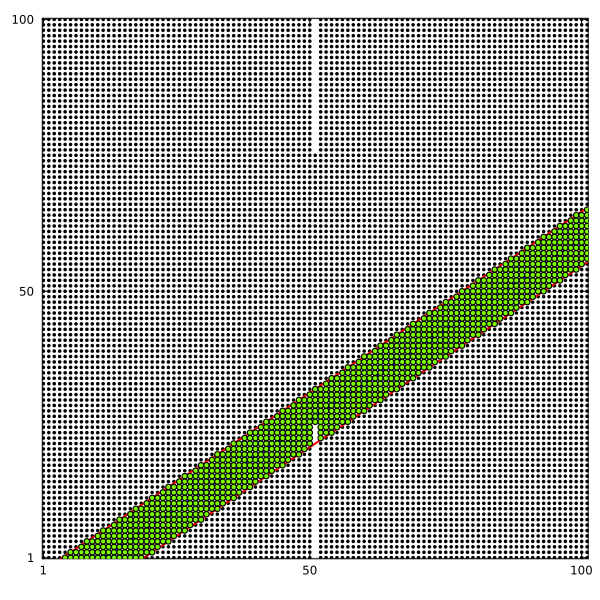

In [8]:
### PTB_index will contain ordered indices of the sites in PTB

PTB_index_dummy = collect(range(1,n_atoms,n_atoms))
for ii = 1:n_atoms
    if (points_y_array[ii] >= line_down(points_x_array[ii])) && (points_y_array[ii] <= line_up(points_x_array[ii]))
        ## Do nothing
    else
        PTB_index_dummy[ii] = 0.0
    end
end

## Here we store non-zero indices
PTB_index = findall(!iszero, PTB_index_dummy)

N_PTB = size(PTB_index)[1]

points_PTB_array_x = zeros(N_PTB)
points_PTB_array_y = zeros(N_PTB)

for ii = 1:N_PTB
    points_PTB_array_x[ii] = points_x_array[PTB_index[ii]]
    points_PTB_array_y[ii] = points_y_array[PTB_index[ii]]
end

### Draw lines separating PTB
line_x = [1.0,Lx+1]
line_down_y = line_down.(line_x)
line_up_y = line_up.(line_x)

plt_lattice=scatter(points_x_array, points_y_array,aspect_ratio=1,legend=false, 
                    xlims=[0.8,Lx+1.2], ylims=[0.8,Lx+0.2],color="black",markersize=2, frame=:box, framestyle=:thick, xticks=[1,Lx/2,Lx],yticks=[1,Ly/2,Ly], size=(600,600))
plt_lattice=plot!(line_x,line_down_y,color="red",width=2)
plt_lattice=plot!(line_x,line_up_y,color="red",width=2)
plt_lattice=plot!(line_x,line_middle.(line_x),color="blue",width=2)
plt_lattice=scatter!(points_PTB_array_x, points_PTB_array_y,color="lawngreen",aspect_ratio=1,legend=false,markersize=3)

In [9]:
points_PTB_array_x

928-element Vector{Float64}:
   5.0
   6.0
   7.0
   8.0
   9.0
  10.0
  11.0
  12.0
  13.0
  14.0
   ⋮
 101.0
  98.0
  99.0
 100.0
 101.0
  99.0
 100.0
 101.0
 101.0

## Percentage of sites in PTB

In [10]:
println("Number of sites in PTB = ",N_PTB)
println("Amount of sites in PTB = ",100* N_PTB/L^2, " %")

Number of sites in PTB = 928
Amount of sites in PTB = 9.28 %


In [11]:
println(PTB_index)

[5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 309, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 411, 412, 413, 414, 415, 416, 417, 418, 419, 420, 421, 422, 423, 424, 425, 512, 513, 514, 515, 516, 517, 518, 519, 520, 521, 522, 523, 524, 525, 526, 527, 614, 615, 616, 617, 618, 619, 620, 621, 622, 623, 624, 625, 626, 627, 628, 715, 716, 717, 718, 719, 720, 721, 722, 723, 724, 725, 726, 727, 728, 729, 730, 817, 818, 819, 820, 821, 822, 823, 824, 825, 826, 827, 828, 829, 830, 831, 918, 919, 920, 921, 922, 923, 924, 925, 926, 927, 928, 929, 930, 931, 932, 933, 1020, 1021, 1022, 1023, 1024, 1025, 1026, 1027, 1028, 1029, 1030, 1031, 1032, 1033, 1034, 1121, 1122, 1123, 1124, 1125, 1126, 1127, 1128, 1129, 1130, 1131, 1132, 1133, 1134, 1135, 1136, 1223, 1224, 1225, 1226, 1227, 1228, 1229, 1230, 1231, 1232

## Coordinates of projected sites

### Equation of line_down is $y=mx + c_1$
### Equation of projector line is, $y-y_1 = (-1/m).(x-x_1)$, where $(x_1,y_1)$ is the coordinate of the site
### The two lines intersect at $((m.y_1 + x_1 - m.c_1)/(m^2 + 1), (m^2.y_1 + m.x_1 + c_1)/(m^2 + 1))$

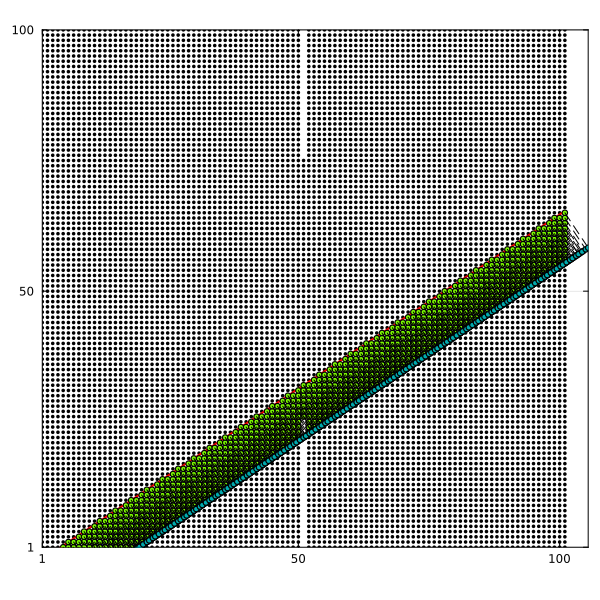

In [12]:
projected_points_PTB_array_x = (m*points_PTB_array_y + points_PTB_array_x - m*ones(N_PTB)*c1)/(m^2 + 1);
projected_points_PTB_array_y = m*projected_points_PTB_array_x + c1 * ones(N_PTB);

## This array contains distance along the line
## This should be x coordinates on the line * sec(theta), where the slope is tan(theta) = m
distance_along_projected_line = projected_points_PTB_array_x * sqrt(m^2 +1)

for ii = 1:N_PTB
    line_projected_x = [points_PTB_array_x[ii],projected_points_PTB_array_x[ii]]
    line_projected_y = [points_PTB_array_y[ii],projected_points_PTB_array_y[ii]]
    plt_lattice=plot!(line_projected_x,line_projected_y,linestyle=:dash, color="black")
end
plt_lattice=scatter!(projected_points_PTB_array_x,projected_points_PTB_array_y, 
            xlims=(1,maximum(vcat(projected_points_PTB_array_x,Lx))), ylims=(1,maximum(vcat(projected_points_PTB_array_y,Ly))), markersize=3)
display(plt_lattice)

## Generate Parent Hamiltonian

In [13]:
include("generate_matrices_dislocation2D.jl")
include("angmom.jl")

generate_spin_matrices (generic function with 1 method)

In [14]:
println("t = ",t)
println("t_prime = ", t_prime)
println("t_0 = ", t0)
println("m_0 = ", m_0)
println("Lx = ", Lx)
println("Ly = ", Ly)

t = 1.0
t_prime = -1.5
t_0 = 1.0
m_0 = 3.0
Lx = 100
Ly = 100


In [15]:
if(x_periodic^2 != x_periodic || y_periodic^2 != y_periodic)
    println("x_periodic and y_periodic must be 0 or 1")
    println("You entered x_periodic = ", x_periodic, " y_periodic = ", y_periodic)
    return
end

In [16]:
sigma_x = [0 1;
           1 0];
sigma_y = [0 -im;
           im 0];
sigma_z = [1 0;
           0 -1];
eye2 = [1 0;
        0 1];
gamma_01 = kron(eye2, sigma_x);
gamma_02 = kron(eye2, sigma_y);
gamma_03 = kron(eye2, sigma_z);
gamma_13 = kron(sigma_x,sigma_z);
gamma_30 = kron(sigma_z, eye2);
gamma_31 = kron(sigma_z, sigma_x);
gamma_32 = kron(sigma_z, sigma_y);
gamma_33 = kron(sigma_z, sigma_z);

In [17]:

const_2D, CX2D, SX2D, CY2D, SY2D, CXCY2D = generate_matrices_double_dislocation2D(Lx, Ly, l1,l2,m_lattice,x_periodic, y_periodic)

h_scti = t*kron((SX2D + (CX2D*SY2D + SY2D*CX2D)/2),sigma_x) + t*kron(SY2D+(SX2D*CY2D + CY2D*SX2D)/2,sigma_y) + kron((m_0-2*t_prime)*const_2D + t0*(CX2D + CY2D) + 2*t_prime*CXCY2D,sigma_z)

## Here is the Hamiltonian of regular Chern insulator for quick check
#h_SC_chern = Hermitian(t*kron((SX2D),sigma_x) + t*kron(SY2D,sigma_y) + kron((m_0)*const_2D - t0*(CX2D + CY2D),sigma_z))

if(Hermitian_Check(h_scti) == false)
    println("Error! Hamiltonian is not Hermitian")
    return
end

Verified: Building Block Matrices are Hermitian


### The following (commented out to save execution time) is the code for local Chern marker in the parent lattice

In [18]:
# (energy_eigenvalues_parent, eigenstates_parent) = eigen(h_scti);


In [19]:
# println(size(X1_parent))

In [20]:
# println("size eigenstates_parent = ", size(eigenstates_parent))


In [21]:
# plt1 = scatter(1:2*(Lx*Ly+l2), energy_eigenvalues_parent)
# display(plt1)

In [22]:
# Gap_parent = minimum(abs.(energy_eigenvalues_parent))

### I plot the local Chern marker at the middle line $y = L_y/2$ of the lattice

In [23]:
# ### We will plot the local Chern marker along the line y = Ly/2
# plt_Chern_parent = scatter(1:Lx, ChernMatrixSiteWiseList_parent[(Int(round(Ly/2)) - 1)*Lx+1:(Int(round(Ly/2)) - 1)*Lx+Lx], ylims=(-3,3), 
#                 xlabel="x", ylabel="Perent lattice Local Chern marker at y=L/2", legend=:none,
#                 title=string("Lx = ", string(Lx), ", t = ", string(t), ", Delta = ", string(Delta), ", m0 = ", string(m_0), ", mu = ", string(mu)))
# display(plt_Chern_parent)

## Clear Variables

In [24]:
const_2D= Nothing
CX2D= Nothing
SX2D= Nothing
CY2D= Nothing
SY2D= Nothing
CXCY2D= Nothing
SXCY2D= Nothing
CXSY2D= Nothing

Nothing

## Now generate PTB Hamiltonian

In [25]:
PTB_orbital_index = ones(2*N_PTB);
for ii = 1:N_PTB
    PTB_orbital_index[2*ii-1] = 2*PTB_index[ii]-1
    PTB_orbital_index[2*ii] = 2*PTB_index[ii]
end
println(PTB_orbital_index)

[9.0, 10.0, 11.0, 12.0, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34.0, 35.0, 36.0, 37.0, 38.0, 211.0, 212.0, 213.0, 214.0, 215.0, 216.0, 217.0, 218.0, 219.0, 220.0, 221.0, 222.0, 223.0, 224.0, 225.0, 226.0, 227.0, 228.0, 229.0, 230.0, 231.0, 232.0, 233.0, 234.0, 235.0, 236.0, 237.0, 238.0, 239.0, 240.0, 241.0, 242.0, 415.0, 416.0, 417.0, 418.0, 419.0, 420.0, 421.0, 422.0, 423.0, 424.0, 425.0, 426.0, 427.0, 428.0, 429.0, 430.0, 431.0, 432.0, 433.0, 434.0, 435.0, 436.0, 437.0, 438.0, 439.0, 440.0, 441.0, 442.0, 443.0, 444.0, 617.0, 618.0, 619.0, 620.0, 621.0, 622.0, 623.0, 624.0, 625.0, 626.0, 627.0, 628.0, 629.0, 630.0, 631.0, 632.0, 633.0, 634.0, 635.0, 636.0, 637.0, 638.0, 639.0, 640.0, 641.0, 642.0, 643.0, 644.0, 645.0, 646.0, 647.0, 648.0, 821.0, 822.0, 823.0, 824.0, 825.0, 826.0, 827.0, 828.0, 829.0, 830.0, 831.0, 832.0, 833.0, 834.0, 835.0, 836.0, 837.0, 838.0, 839.0, 840.0, 841.0, 842.0, 843.0, 8

In [26]:
outside_orbital_index = setdiff(1:2*n_atoms,PTB_orbital_index);
println(outside_orbital_index)

[1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 59.0, 60.0, 61.0, 62.0, 63.0, 64.0, 65.0, 66.0, 67.0, 68.0, 69.0, 70.0, 71.0, 72.0, 73.0, 74.0, 75.0, 76.0, 77.0, 78.0, 79.0, 80.0, 81.0, 82.0, 83.0, 84.0, 85.0, 86.0, 87.0, 88.0, 89.0, 90.0, 91.0, 92.0, 93.0, 94.0, 95.0, 96.0, 97.0, 98.0, 99.0, 100.0, 101.0, 102.0, 103.0, 104.0, 105.0, 106.0, 107.0, 108.0, 109.0, 110.0, 111.0, 112.0, 113.0, 114.0, 115.0, 116.0, 117.0, 118.0, 119.0, 120.0, 121.0, 122.0, 123.0, 124.0, 125.0, 126.0, 127.0, 128.0, 129.0, 130.0, 131.0, 132.0, 133.0, 134.0, 135.0, 136.0, 137.0, 138.0, 139.0, 140.0, 141.0, 142.0, 143.0, 144.0, 145.0, 146.0, 147.0, 148.0, 149.0, 150.0, 151.0, 152.0, 153.0, 154.0, 155.0, 156.0, 157.0, 158.0, 159.0, 160.0, 161.0, 162.0, 163.0, 164.0, 165.0, 166.0, 167.0, 168.0, 169.0, 170.0, 171.0, 172.0, 173.0, 174.0, 175.0, 176.0, 177.0, 178.0, 179.0, 180.0, 181.0, 182.0, 183.0, 184.0

In [27]:
NOrbitalsOutside = 2*n_atoms - 2*N_PTB

18244

In [28]:
NOrbitalsInside = 2*N_PTB

1856

In [29]:
H_PTB_renor = zeros(NOrbitalsInside,NOrbitalsInside)*im;

H_11 = zeros(NOrbitalsInside,NOrbitalsInside)*im;

H_22 = zeros(NOrbitalsOutside,NOrbitalsOutside)*im;

H_21 = zeros(NOrbitalsOutside,NOrbitalsInside)*im;

H_12 = zeros(NOrbitalsInside,NOrbitalsOutside)*im;

In [30]:
for ii = 1:NOrbitalsInside
    for jj = 1:NOrbitalsInside
        H_11[ii,jj] = h_scti[Int(PTB_orbital_index[ii]), Int(PTB_orbital_index[jj])]
    end
end

In [31]:
Threads.@threads for ii = 1:NOrbitalsOutside
    for jj = 1:NOrbitalsOutside
        H_22[ii,jj] = h_scti[Int(outside_orbital_index[ii]), Int(outside_orbital_index[jj])]
    end
end

In [32]:
Threads.@threads for ii = 1:NOrbitalsInside
    for jj = 1:NOrbitalsOutside
        H_12[ii,jj] = h_scti[Int(PTB_orbital_index[ii]), Int(outside_orbital_index[jj])]
    end
end

In [33]:
Threads.@threads for ii = 1:NOrbitalsOutside
    for jj = 1:NOrbitalsInside
        H_21[ii,jj] = h_scti[Int(outside_orbital_index[ii]), Int(PTB_orbital_index[jj])]
    end
end

## Clear variables

In [34]:
h_scti= Nothing

Nothing

## Add a small constant matrix to invert matrix H_22 in case its eigenvalue is 0

In [35]:
H_PTB_renor = H_11 - Hermitian(H_12*inv(Hermitian(H_22 + 10^(-8)*Matrix(1.0I, NOrbitalsOutside, NOrbitalsOutside)))*H_21);

In [36]:
H_11= Nothing
H_12= Nothing
H_21= Nothing
H_22= Nothing

Nothing

In [37]:
(energy_eigenvalues_PTB, eigenstates_PTB) = eigen(H_PTB_renor);

In [38]:
if(Hermitian_Check(H_PTB_renor) == false)
    println("Error! Hamiltonian is not Hermitian")
    return
end

In [39]:
println("size H_PTB_renor = ", size(H_PTB_renor))
println("size eigenstates = ", size(eigenstates_PTB))

size H_PTB_renor = (1856, 1856)
size eigenstates = (1856, 1856)


In [40]:
Gap_PTB = 2*minimum(abs.(energy_eigenvalues_PTB))

2.5143069004113805

In [41]:
energy_eigenvalues_PTB[Int(round(NOrbitalsInside/2))],energy_eigenvalues_PTB[Int(round(NOrbitalsInside/2)-1)]

(-1.2571534502056902, -1.261160298689637)

In [42]:
N_PTB, NOrbitalsInside

(928, 1856)

## Filename

In [43]:
# Define the folder path (relative or absolute)
folder_path = "data/hstci/dislocation/"  # Change to your desired folder
# Ensure the folder exists
isdir(folder_path) || mkdir(folder_path)


filename = "t0=$(t0)_t=$(t)_t_prime=$(t_prime)_m_0=$(m_0)_x_periodic=$(x_periodic)_y_periodic=$(y_periodic)_L=$(L)_l1=$(l1)_l2=$(l2)_mlattice=$(m_lattice)_m=$(m)_c1=$(c1)_c2=$(c2).csv"

"t0=1.0_t=1.0_t_prime=-1.5_m_0=3.0_x_periodic=1_y_periodic=1_L=100_l1=25_l2=50_mlattice=50_m=0.6666666666666666_c1=-12_c2=-2.csv"

## Bulk boundary correspondence

In [44]:
## Here we determine the number of dislocation states

zero_en_states = 2;
if abs(energy_eigenvalues_PTB[N_PTB]) < 10^(-3)
    zero_en_states =1
    if abs(energy_eigenvalues_PTB[N_PTB+1]) < 10^(-3)
        zero_en_states += 1
    end
end

In [45]:
zero_en_states

2

In [46]:
energy_eigenvalues_PTB[N_PTB+1]

1.2571534518397025

In [47]:
energy_eigenvalues_PTB[N_PTB]

-1.2571534502056902

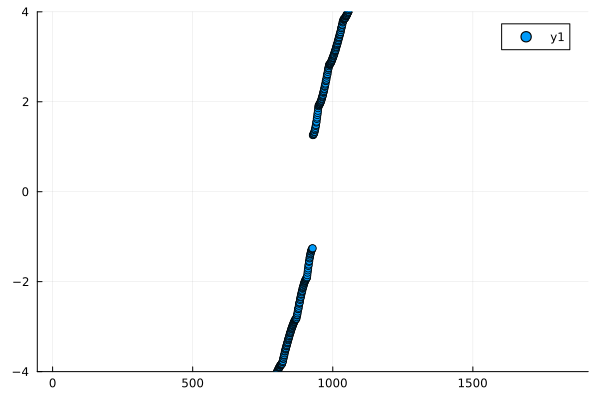

In [48]:
plt2 = scatter(1:NOrbitalsInside, energy_eigenvalues_PTB, ylims=(-4,4))
display(plt2)

In [49]:
isdir(string(folder_path,"energies/")) || mkdir(string(folder_path,"energies/"))

if exportdata==1
    CSV.write(string(folder_path,"energies/",filename), (; energy_eigenvalues_PTB),writeheader=false)
end

"data/hstci/dislocation/energies/t0=1.0_t=1.0_t_prime=-1.5_m_0=3.0_x_periodic=1_y_periodic=1_L=100_l1=25_l2=50_mlattice=50_m=0.6666666666666666_c1=-12_c2=-2.csv"

In [50]:
function state_to_real_space_LDoS(v::Array{ComplexF64})
    n_sites = Int(size(v)[1]/2)
    prob_dist = zeros(n_sites)
    for ii = 1:n_sites
        prob_dist[ii] = abs(v[2*ii-1])^2 +  abs(v[2*ii])^2
    end
    return prob_dist
end 

state_to_real_space_LDoS (generic function with 1 method)

In [51]:
N_PTB

928

## Plot of LDoS of topological states of PTB

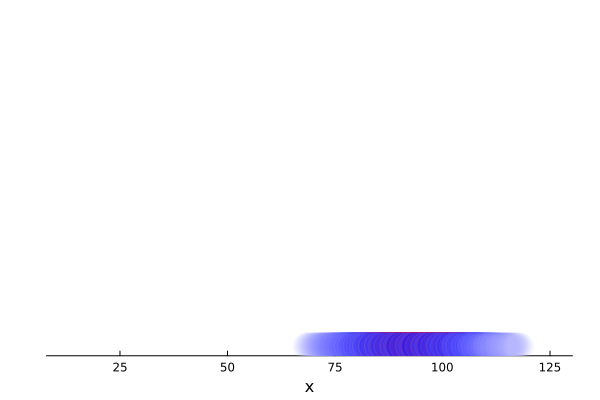

In [52]:
#boundary_state_nearest_zero = eigenstates_PTB[:,N_PTB];
if zero_en_states == 1
    probability_boundary_state = state_to_real_space_LDoS(eigenstates_PTB[:,N_PTB]);
elseif zero_en_states == 2
    probability_boundary_state = state_to_real_space_LDoS(eigenstates_PTB[:,N_PTB]) + state_to_real_space_LDoS(eigenstates_PTB[:,N_PTB+1]);
end

color_map = cgrad([RGB(1,1,1), RGB(0,0,1), RGB(1,0,0)])

# Calculate alphas based on y values
function alpha_function(p, pmax)
    if p < pmax/10
        return 0
    else
        return p/pmax
    end
end
alphas = alpha_function.(probability_boundary_state, maximum(probability_boundary_state))

#plt_PTB_BD_states = scatter(distance_along_projected_line, probability_boundary_state)
plt_PTB_BD_states = scatter(distance_along_projected_line, ones(N_PTB), 
                            zcolor=probability_boundary_state, legend=false, xlabel="x", colorbar_title="Value",
                            c=color_map, ms=15, seriesalpha=alphas, markerstrokewidth=0, grid=false,
                            yaxis=false)

display(plt_PTB_BD_states)

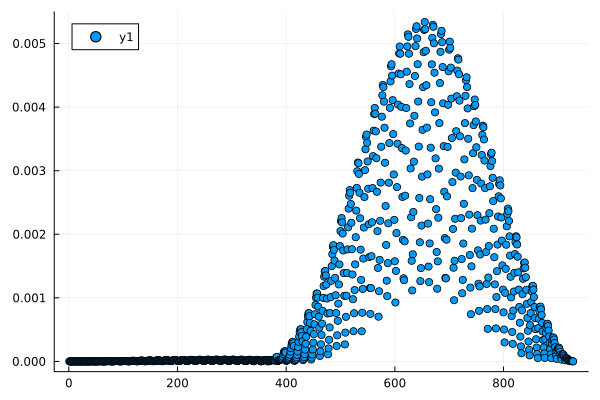

In [53]:
scatter(1:N_PTB,state_to_real_space_LDoS(eigenstates_PTB[:,N_PTB]))

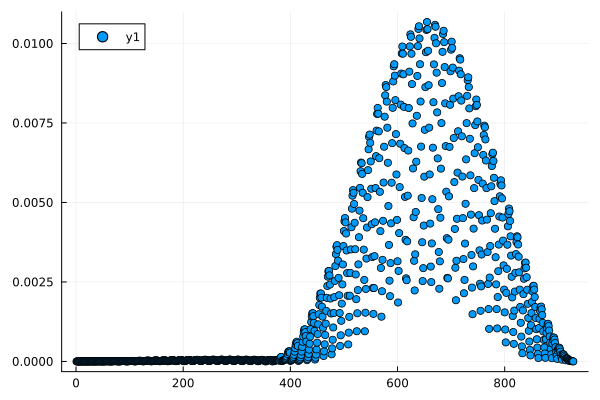

In [54]:
scatter(1:N_PTB,state_to_real_space_LDoS(eigenstates_PTB[:,N_PTB]) + state_to_real_space_LDoS(eigenstates_PTB[:,N_PTB+1]))

In [55]:
isdir(string(folder_path,"LDOS/")) || mkdir(string(folder_path,"LDOS/"))

if exportdata==1
    CSV.write(string(folder_path,"LDOS/",filename), (; probability_boundary_state),writeheader=false)
end

"data/hstci/dislocation/LDOS/t0=1.0_t=1.0_t_prime=-1.5_m_0=3.0_x_periodic=1_y_periodic=1_L=100_l1=25_l2=50_mlattice=50_m=0.6666666666666666_c1=-12_c2=-2.csv"

In [56]:
t_end=time();

In [57]:
println("time taken = ", t_end - t_start," seconds")

time taken = 420.4881181716919 seconds
